# Evaluation of extremes of models on 60km -> 2.2km-4x over Birmingham

In [ ]:
%reload_ext autoreload

%autoreload 2

%reload_ext dotenv
%dotenv

In [ ]:
from mlde_analysis.default_params import *

In [ ]:
# Parameters
desc = "Comparison of diffusion model for CPMGEM-pr paper\nTest split\n12em dataset and models, 60km inputs -> 8.8km outputs, pSTV input variable set\nCompare techniques: diffusion, u-net, bilinear\n"
eval_vars = ["pr"]
derived_variables_config = {}
dataset_configs = {
    "CPM": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
    "GCM": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
}
split = "test"
ensemble_members = [
    "01",
    "04",
    "05",
    "06",
    "07",
    "08",
    "09",
    "10",
    "11",
    "12",
    "13",
    "15",
]
samples_per_run = 6
sample_configs = {
    "CPM": [
        {
            "label": "CPMGEM_cCPM",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pSTV",
                    "checkpoint": "epoch_20",
                    "input_xfm": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-stan",
                    "dataset": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": False,
            "CCS": True,
            "color": "tab:blue",
            "order": 11,
        },
        {
            "label": "U-Net_cCPM",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/deterministic/ukcp_local_pr_12em_plain_unet/bham_pSTV-ema-gradcl-256-batch",
                    "checkpoint": "epoch_100",
                    "input_xfm": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-stan",
                    "dataset": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": True,
            "color": "tab:orange",
            "order": 2,
        },
        {
            "label": "BCSD_cCPM",
            "sample_specs": [
                {
                    "fq_model_id": "bcsd-v1/ukcp_local_pr_12em-ws3",
                    "checkpoint": "epoch-0",
                    "input_xfm": "bham64_ccpm-4x_12em_linpr_pr-bcsd",
                    "dataset": "bham64_ccpm-4x_12em_linpr_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": True,
            "color": "tab:red",
            "order": 1,
            "UQ": True,
            "CCS": True,
        },
    ],
    "GCM": [
        {
            "label": "CPMGEM_GCM",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pSTV",
                    "checkpoint": "epoch_20",
                    "input_xfm": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-pixelmmsstan",
                    "dataset": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": False,
            "CCS": True,
            "UQ": False,
            "color": "tab:green",
            "order": 20,
        }
    ],
}
sample_configs_at_60km = [
    {
        "label": "CPMGEM_GCM@60km",
        "sample_specs": [
            {
                "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pSTV/postprocess/gcm-grid",
                "checkpoint": "epoch_20",
                "input_xfm": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-pixelmmsstan",
                "dataset": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                "variables": ["pr"],
            }
        ],
        "deterministic": False,
    }
]
dataset_configs_at_60km = {
    "CPM": "bham64_ccpm-60km_12em_pr_pr",
    "GCM": "bham64_gcm-60km_12em_rawpr_pr",
}
example_percentiles = {
    "CPM": {
        "DJF Wet": {"percentile": 0.8, "variable": "pr", "season": "DJF"},
        "DJF Wettest": {"percentile": 1, "variable": "pr", "season": "DJF"},
        "JJA Wet": {"percentile": 0.8, "variable": "pr", "season": "JJA"},
        "JJA Wettest": {"percentile": 1, "variable": "pr", "season": "JJA"},
    },
    "GCM": {
        "DJF Wet": {"percentile": 0.8, "variable": "pr", "season": "DJF"},
        "DJF Wettest": {"percentile": 1, "variable": "pr", "season": "DJF"},
        "JJA Wet": {"percentile": 0.8, "variable": "pr", "season": "JJA"},
        "JJA Wettest": {"percentile": 1, "variable": "pr", "season": "JJA"},
    },
}
example_overrides = {"CPM": {"JJA Wet": ["01", "1993-08-01 12:00:00"]}, "GCM": {}}
examples_sample_idxs = [2, 5]
niterations = 30
bootstrap_configs = {"niterations": {"spread-error": 50}}


In [ ]:
import functools
import itertools
import math
import string

import cf_xarray
import IPython
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

from mlde_analysis import plot_map, STYLES, SUBREGIONS, BOX_LOCATIONS
from mlde_analysis.display import pretty_table, VAR_RANGES
from mlde_analysis.distribution import plot_freq_density_figure, compute_metrics, DIST_THRESHOLDS, stat_bias, rms, plot_freq_density, plot_biases
from mlde_analysis.extremes import pred_and_target_return_levels, plot_return_levels, pretty_return_levels_table
from mlde_utils import cp_model_rotated_pole, platecarree
from mlde_analysis import qq_plot, reasonable_quantiles
from mlde_analysis.utils import chained_groupby_map

In [ ]:
matplotlib.rcParams['figure.dpi'] = 300

In [ ]:
IPython.display.Markdown(desc)

Comparison of diffusion model for CPMGEM-pr paper
Test split
12em dataset and models, 60km inputs -> 8.8km outputs, pSTV input variable set
Compare techniques: diffusion, u-net, bilinear


In [ ]:
%reload_ext mlde_analysis.magics 
EVAL_DS, MODELS, CPM_DAS, PRED_DAS, VAR_DAS, MODELLABEL2SPEC = %load_eval_data
EVAL_DS

{'CPM': <xarray.Dataset> Size: 34GB
 Dimensions:                     (model: 3, sample_id: 6, ensemble_member: 12,
                                  time: 3240, grid_latitude: 64,
                                  grid_longitude: 64, bnds: 2)
 Coordinates:
   * ensemble_member             (ensemble_member) <U2 96B '01' '04' ... '15'
   * time                        (time) object 26kB 1981-03-01 12:00:00 ... 20...
     season                      (time) int64 26kB 1 1 1 1 1 1 1 ... 2 2 2 2 2 2
   * grid_latitude               (grid_latitude) float32 256B -2.49 ... 2.55
   * grid_longitude              (grid_longitude) float32 256B 357.9 ... 363.0
     time_period                 (time) <U8 104kB 'historic' ... 'future'
   * model                       (model) object 24B 'CPMGEM_cCPM' ... 'BCSD_cCPM'
     dec_adjusted_year           (time) int64 26kB 1981 1981 1981 ... 2076 2076
     stratum                     (time) <U12 156kB 'historic MAM' ... 'future ...
     tp_season_year         

## Max bias

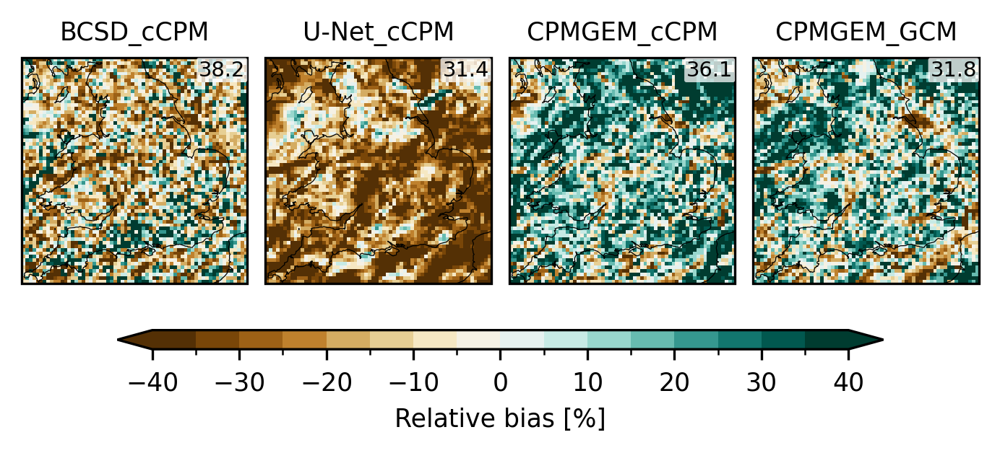

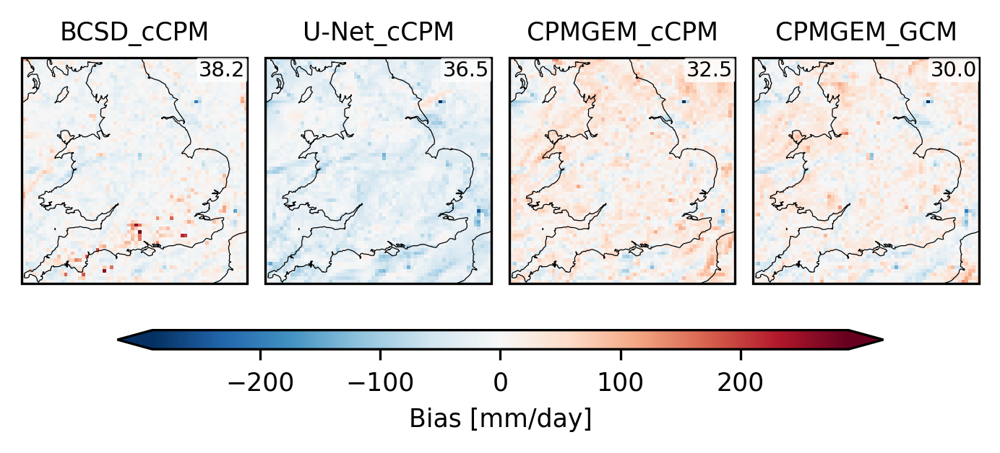

In [ ]:
for var in eval_vars:
    for normalize in [True, False]:
        max_biases = PRED_DAS[var].groupby("model").map(functools.partial(stat_bias, stat_func=xr.DataArray.max), cpm_da=VAR_DAS[var][f"target_{var}"], normalize=normalize)

        fig = plt.figure(layout="constrained", figsize=(4.5, 4.5))
        axd = fig.subplot_mosaic(
            max_biases.model.values.reshape(1,-1),
            subplot_kw={"projection": cp_model_rotated_pole},            
        )
        plotable_max_biases = sorted(
            map(
                lambda modelgp: dict(data=modelgp[1].squeeze("model"), label=modelgp[0]),
                max_biases.groupby("model", squeeze=False),
            ),
            key=lambda x: MODELLABEL2SPEC[x["label"]]["order"],
        )
        if normalize:
            style = f"{var}Bias"
        else:
            style = None
        plot_biases(plotable_max_biases, list(axd.values()), fig, colorbar=True, style=style)

## RX1day bias

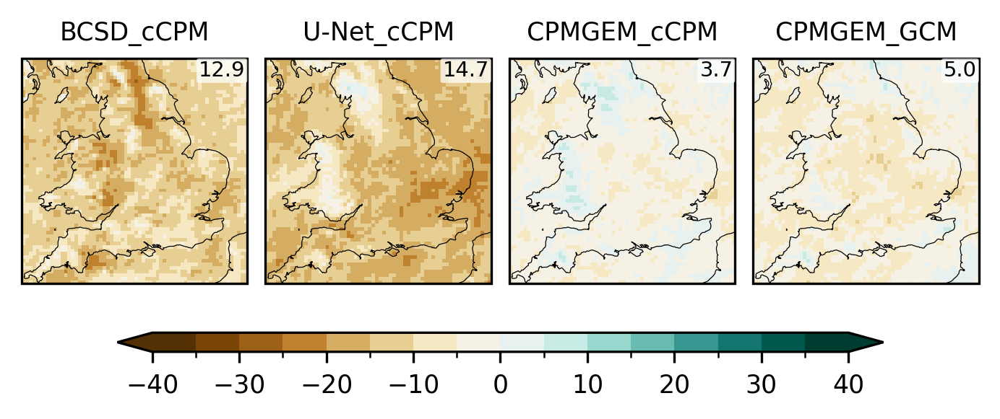

In [ ]:
for var in eval_vars:    
    pred_rx1day_mean = PRED_DAS[var].groupby("dec_adjusted_year").max(dim=["time"]).mean(dim=["dec_adjusted_year", "ensemble_member"]).mean(dim=["sample_id"])
    target_rx1day_mean = VAR_DAS[var][f"target_{var}"].groupby("dec_adjusted_year").max(dim=["time"]).mean(dim=["dec_adjusted_year", "ensemble_member"])
    rx1day_bias = 100*(pred_rx1day_mean - target_rx1day_mean)/target_rx1day_mean
    
    fig = plt.figure(layout="constrained", figsize=(4.5, 4.5))
    axd = fig.subplot_mosaic(
        pred_rx1day_mean.model.values.reshape(1,-1),
        subplot_kw={"projection": cp_model_rotated_pole},            
    )
    plotable_rx1day_biases = sorted(
        map(
            lambda modelgp: dict(data=modelgp[1].squeeze("model"), label=modelgp[0]),
            rx1day_bias.groupby("model", squeeze=False),
        ),
        key=lambda x: MODELLABEL2SPEC[x["label"]]["order"],
    )
    plot_biases(plotable_rx1day_biases, list(axd.values()), fig, colorbar=True, style=f"{var}Bias")

## Q0.999 bias

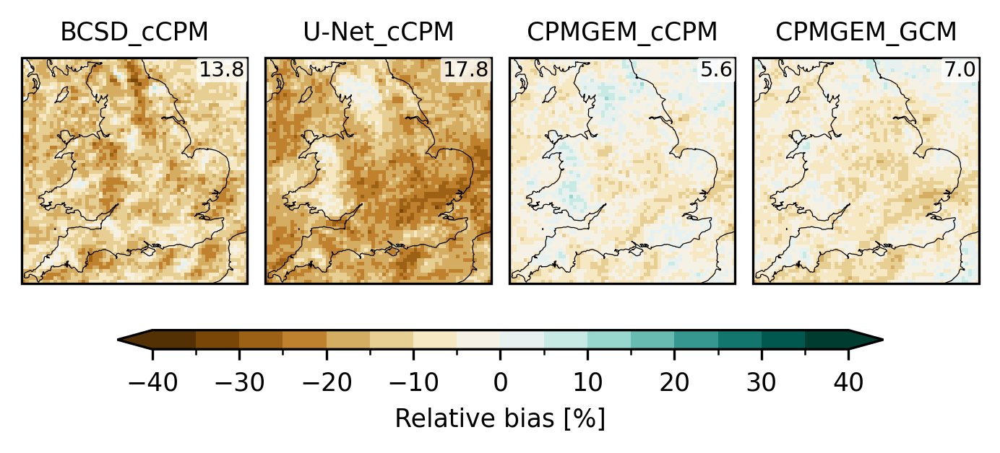

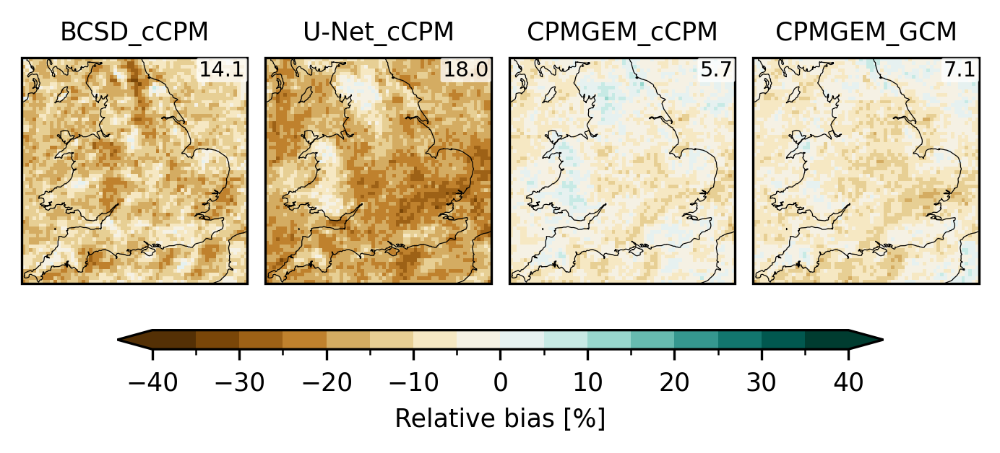

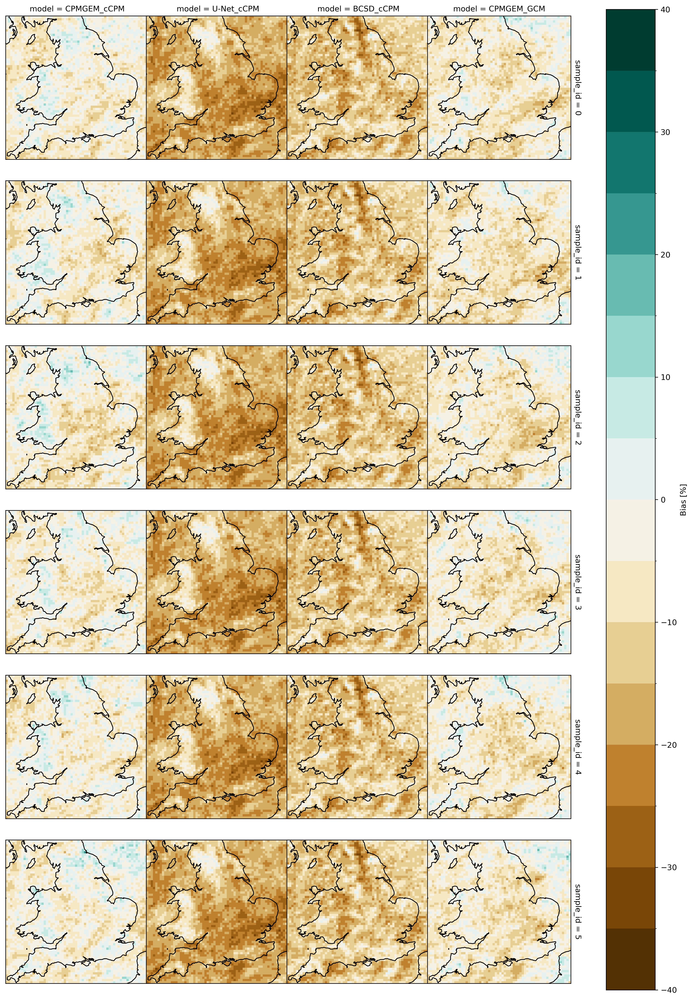

In [ ]:
for var in eval_vars:
    for normalize in [True]:#, False]:
        if normalize:
            style = f"{var}Bias"
        else:
            style = None

        q999_biases = chained_groupby_map(PRED_DAS[var], ["model"], functools.partial(stat_bias, stat_func=functools.partial(xr.DataArray.quantile, q=0.999)), cpm_da=VAR_DAS[var][f"target_{var}"], normalize=normalize)
        
        fig = plt.figure(layout="constrained", figsize=(4.5, 4.5))
        axd = fig.subplot_mosaic(
            q999_biases.model.values.reshape(1,-1),
            subplot_kw={"projection": cp_model_rotated_pole},            
        )
        plotable_q999_biases = sorted(
            map(
                lambda modelgp: dict(data=modelgp[1].squeeze("model"), label=modelgp[0]),
                q999_biases.groupby("model", squeeze=False),
            ),
            key=lambda x: MODELLABEL2SPEC[x["label"]]["order"],
        )
        plot_biases(plotable_q999_biases, list(axd.values()), fig, colorbar=True, style=style)
        
        q999_biases = chained_groupby_map(PRED_DAS[var], ["model", "sample_id"], functools.partial(stat_bias, stat_func=functools.partial(xr.DataArray.quantile, q=0.999)), cpm_da=VAR_DAS[var][f"target_{var}"], normalize=normalize)
        
        fig = plt.figure(layout="constrained", figsize=(4.5, 4.5))
        axd = fig.subplot_mosaic(
            q999_biases.model.values.reshape(1,-1),
            subplot_kw={"projection": cp_model_rotated_pole},            
        )
        plotable_q999_biases = sorted(
            map(
                lambda modelgp: dict(data=modelgp[1].squeeze("model"), label=modelgp[0]),
                q999_biases.mean(dim="sample_id").groupby("model", squeeze=False),
            ),
            key=lambda x: MODELLABEL2SPEC[x["label"]]["order"],
        )
        
        plot_biases(plotable_q999_biases, list(axd.values()), fig, colorbar=True, style=style)
        
        g = q999_biases.plot(col="model", row="sample_id", subplot_kws=dict(projection=cp_model_rotated_pole), **STYLES.get(style, {}))
        for ax in g.axs.flat:
            ax.coastlines()

## QQ plot

### pr

-4


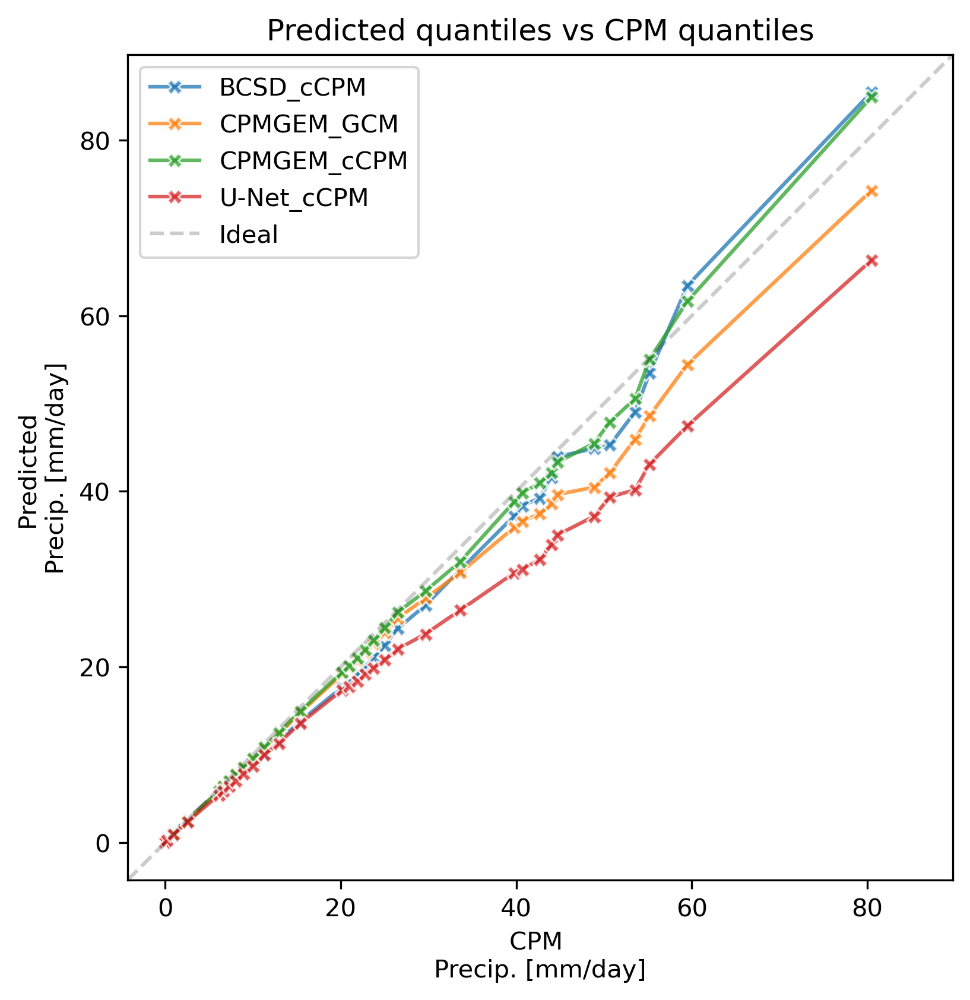

-4


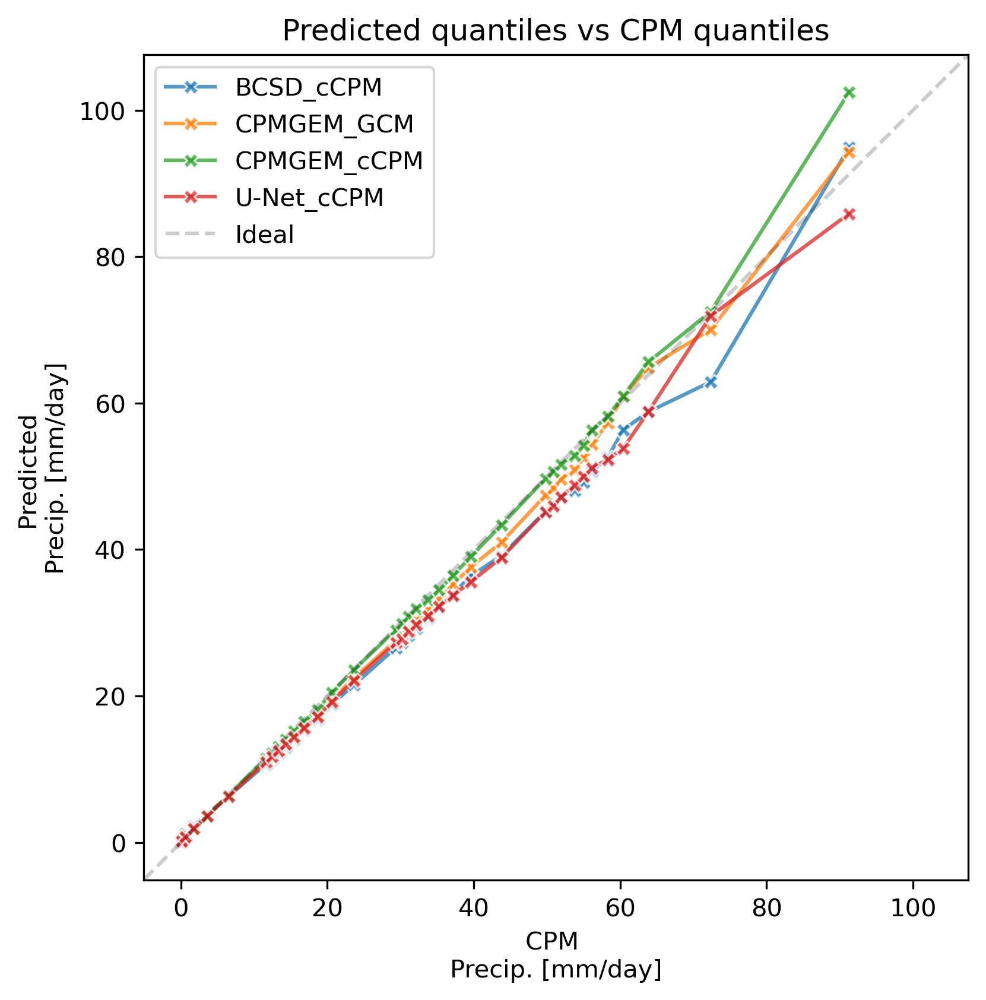

In [ ]:
quantile_dims=["ensemble_member", "time"]

for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)
    for label, q in BOX_LOCATIONS.items():
        ds = VAR_DAS[var].cf.sel(**q, method="nearest")
        pred_da = ds[f"pred_{var}"]
        cpm_da = ds[f"target_{var}"]
        
        quantiles = reasonable_quantiles(cpm_da)
        cpm_quantiles = cpm_da.quantile(quantiles, dim=quantile_dims).rename("target_q")
    
        pred_quantiles = pred_da.quantile(quantiles, dim=quantile_dims).rename("pred_q")

        layout="constrained"

        fig, ax = plt.subplots(figsize=(5.5, 5.5), layout="constrained")

        xlabel = f"CPM \n{xr.plot.utils.label_from_attrs(da=cpm_da)}"
        ylabel = f"Predicted \n{xr.plot.utils.label_from_attrs(da=pred_da)}"

        qq_plot(ax, cpm_quantiles, pred_quantiles, title=f"Predicted quantiles vs CPM quantiles", xlabel=xlabel, ylabel=ylabel)

        plt.show()

## Individual box locations

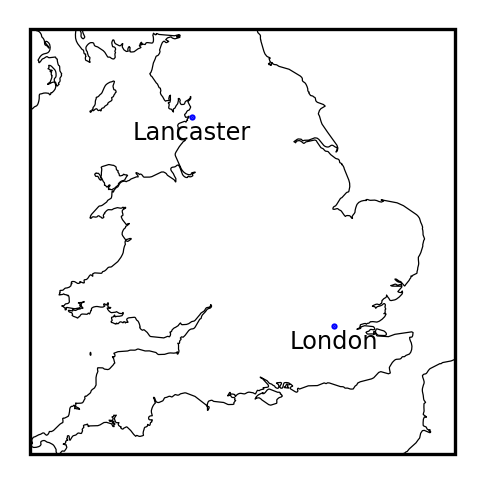

In [ ]:
fig = plt.figure(layout="constrained", figsize=(1.5, 1.5))
ax = fig.subplots(subplot_kw={"projection": cp_model_rotated_pole})
ax.coastlines(**{"resolution": "10m", "linewidth": 0.3})
da = CPM_DAS[eval_vars[0]]
ax.set_extent((
    da.cf["X"].min(),
    da.cf["X"].max(),
    da.cf["Y"].min(),
    da.cf["Y"].max(),
))

for label, q in BOX_LOCATIONS.items():
    single_box_da = da.cf.sel(**q, method="nearest")
    ax.plot(single_box_da.cf["X"].values, single_box_da.cf["Y"].values, color='blue', markersize=0.5, marker='o', transform=cp_model_rotated_pole)
    ax.annotate(
        xy=(single_box_da.cf["X"].item(), single_box_da.cf["Y"].item()), xycoords="data",
        text=label, xytext=(0, -15), textcoords="offset pixels",
        ha='center',va="center", transform=cp_model_rotated_pole, fontsize="xx-small")
    
plt.show()

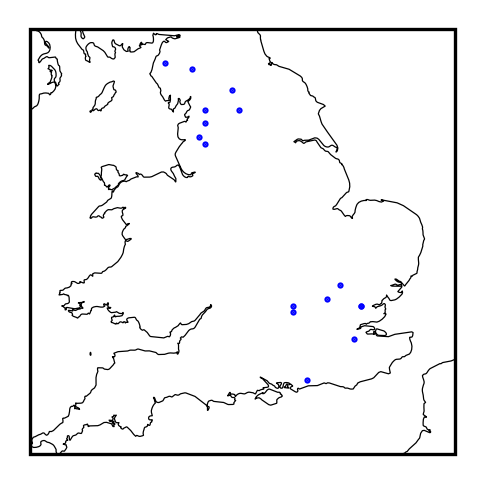

In [ ]:
da = CPM_DAS[eval_vars[0]]

rng = np.random.default_rng(42)

RANDOM_BOX_LOCATIONS = {
    srname: {
        i: { c: rng.choice(da.isel(**SUBREGIONS[srname]).cf[c], 1)[0] for c in ["X", "Y"] }
        for i in range(8) }
    for srname in SUBREGIONS.keys()
}

fig = plt.figure(layout="constrained", figsize=(1.5, 1.5))
ax = fig.subplots(subplot_kw={"projection": cp_model_rotated_pole})
ax.coastlines(**{"resolution": "10m", "linewidth": 0.3})

ax.set_extent((
    da.cf["X"].min(),
    da.cf["X"].max(),
    da.cf["Y"].min(),
    da.cf["Y"].max(),
))

for srname, sr_random_box_locations in RANDOM_BOX_LOCATIONS.items():
    for q in sr_random_box_locations.values():
        single_box_da = da.cf.sel(**q, method="nearest")
        ax.plot(single_box_da.cf["X"].values, single_box_da.cf["Y"].values, color='blue', markersize=0.5, marker='o', transform=cp_model_rotated_pole)
        
plt.show()

## Return time plots (sorting): individual grid box

### pr

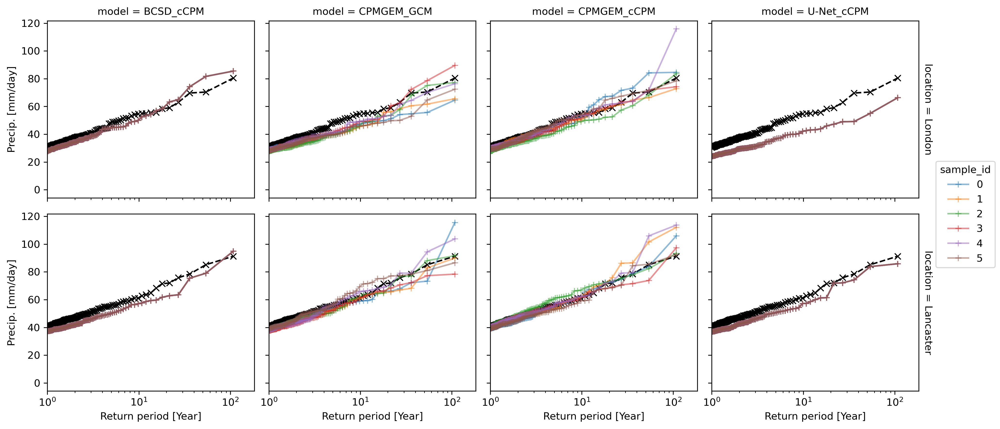

pr Return level errors 
 pr Return level percent errors (%) 
 
 
   
   
 sample_id 
 0 
 1 
 2 
 3 
 4 
 5 
 0 
 1 
 2 
 3 
 4 
 5 
 
 
 location 
 model 
 rp 
   
   
   
   
   
   
   
   
   
   
   
   
 
 
 
 
 Lancaster 
 BCSD_cCPM 
 1.000000 
 -3.22 
 -3.22 
 -3.22 
 -3.22 
 -3.22 
 -3.22 
 -7.95 
 -7.95 
 -7.95 
 -7.95 
 -7.95 
 -7.95 
 
 
 9.818182 
 -4 
 -4 
 -4 
 -4 
 -4 
 -4 
 -6.55 
 -6.55 
 -6.55 
 -6.55 
 -6.55 
 -6.55 
 
 
 108.000000 
 3.66 
 3.66 
 3.66 
 3.66 
 3.66 
 3.66 
 4.01 
 4.01 
 4.01 
 4.01 
 4.01 
 4.01 
 
 
 CPMGEM_GCM 
 1.000000 
 -2.86 
 -2.64 
 -2.43 
 -1.96 
 -1.66 
 -1.63 
 -7.06 
 -6.51 
 -6 
 -4.84 
 -4.11 
 -4.04 
 
 
 9.818182 
 -2.12 
 -0.436 
 0.378 
 0.631 
 4.71 
 8.19 
 -3.47 
 -0.713 
 0.619 
 1.03 
 7.71 
 13.4 
 
 
 108.000000 
 -12.9 
 -4.69 
 -1.3 
 0.387 
 12.5 
 24.3 
 -14.1 
 -5.14 
 -1.42 
 0.424 
 13.7 
 26.6 
 
 
 CPMGEM_cCPM 
 1.000000 
 -1.54 
 -1.19 
 -0.375 
 -0.332 
 -0.00332 
 0.00531 
 -3.8 
 -2.95 
 -0.925 
 -0.819 
 -0.00819 
 0.0131 
 
 
 9.818182 
 -1.9 
 0.648 
 0.663 
 0.7 
 0.912 
 5.73 
 -3.11 
 1.06 
 1.09 
 1.14 
 1.49 
 9.38 
 
 
 108.000000 
 1.1 
 2.06 
 6.12 
 14.7 
 20.8 
 22.4 
 1.2 
 2.25 
 6.71 
 16.1 
 22.8 
 24.6 
 
 
 U-Net_cCPM 
 1.000000 
 -3.7 
 -3.7 
 -3.7 
 -3.7 
 -3.7 
 -3.7 
 -9.14 
 -9.14 
 -9.14 
 -9.14 
 -9.14 
 -9.14 
 
 
 9.818182 
 -3.88 
 -3.88 
 -3.88 
 -3.88 
 -3.88 
 -3.88 
 -6.35 
 -6.35 
 -6.35 
 -6.35 
 -6.35 
 -6.35 
 
 
 108.000000 
 -5.41 
 -5.41 
 -5.41 
 -5.41 
 -5.41 
 -5.41 
 -5.92 
 -5.92 
 -5.92 
 -5.92 
 -5.92 
 -5.92 
 
 
 London 
 BCSD_cCPM 
 1.000000 
 -2.98 
 -2.98 
 -2.98 
 -2.98 
 -2.98 
 -2.98 
 -9.69 
 -9.69 
 -9.69 
 -9.69 
 -9.69 
 -9.69 
 
 
 9.818182 
 -4.68 
 -4.68 
 -4.68 
 -4.68 
 -4.68 
 -4.68 
 -8.57 
 -8.57 
 -8.57 
 -8.57 
 -8.57 
 -8.57 
 
 
 108.000000 
 4.99 
 4.99 
 4.99 
 4.99 
 4.99 
 4.99 
 6.2 
 6.2 
 6.2 
 6.2 
 6.2 
 6.2 
 
 
 CPMGEM_GCM 
 1.000000 
 -2.96 
 -2.42 
 -2.35 
 -2.02 
 -1.96 
 -1.83 
 -9.62 
 -7.87 
 -7.65 
 -6.58 
 -6.37 
 -5.97 
 
 
 9.818182 
 -9.25 
 -8.76 
 -8.56 
 -7.41 
 -5.54 
 -5.31 
 -16.9 
 -16 
 -15.7 
 -13.6 
 -10.1 
 -9.72 
 
 
 108.000000 
 -15.9 
 -14.9 
 -8.1 
 -4.11 
 -3.28 
 9.08 
 -19.8 
 -18.5 
 -10.1 
 -5.1 
 -4.07 
 11.3 
 
 
 CPMGEM_cCPM 
 1.000000 
 -3.03 
 -1.49 
 -1.16 
 -0.969 
 -0.919 
 -0.852 
 -9.87 
 -4.86 
 -3.79 
 -3.15 
 -2.99 
 -2.77 
 
 
 9.818182 
 -5.6 
 -4.26 
 -3.16 
 -2.59 
 -1.16 
 -0.719 
 -10.2 
 -7.79 
 -5.78 
 -4.74 
 -2.12 
 -1.32 
 
 
 108.000000 
 -7.61 
 -6.3 
 -2.04 
 3.09 
 4.09 
 35.4 
 -9.45 
 -7.83 
 -2.54 
 3.84 
 5.09 
 44 
 
 
 U-Net_cCPM 
 1.000000 
 -6.54 
 -6.54 
 -6.54 
 -6.54 
 -6.54 
 -6.54 
 -21.3 
 -21.3 
 -21.3 
 -21.3 
 -21.3 
 -21.3 
 
 
 9.818182 
 -12.6 
 -12.6 
 -12.6 
 -12.6 
 -12.6 
 -12.6 
 -23.1 
 -23.1 
 -23.1 
 -23.1 
 -23.1 
 -23.1 
 
 
 108.000000 
 -14.1 
 -14.1 
 -14.1 
 -14.1 
 -14.1 
 -14.1 
 -17.6 
 -17.6 
 -17.6 
 -17.6 
 -17.6 
 -17.6

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)
    rt_ds = xr.concat(
        [
            pred_and_target_return_levels(
                VAR_DAS[var].cf.sel(**q, method="nearest"), 
                var,
                n_days_per_year=360,
            ).expand_dims(location=[label])
            for label, q in BOX_LOCATIONS.items()
        ],
        dim="location",
    )

    plot_return_levels(rt_ds[f"pred_{var}_return_level"], rt_ds[f"target_{var}_return_level"], row="location")
    plt.show()

    pretty_return_levels_table(rt_ds, var)

## Return time plots (sorting): individual grid box (seasonal)

### pr

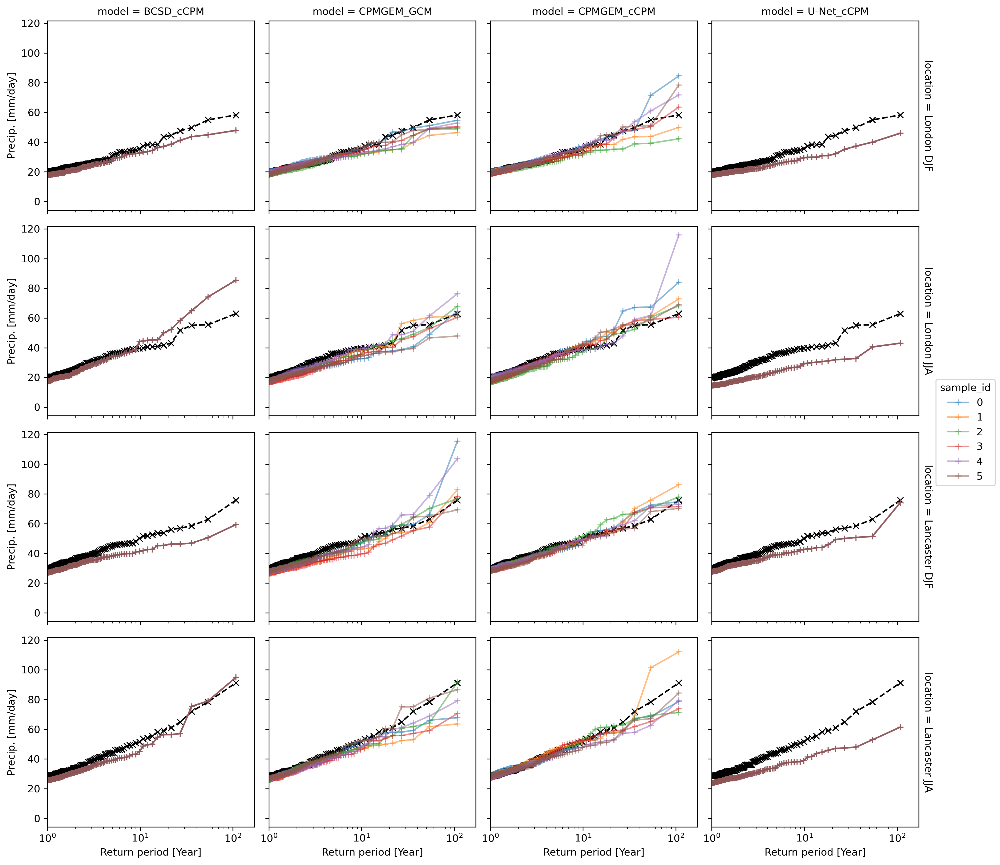

pr Return level errors 
 pr Return level percent errors (%) 
 
 
   
   
 sample_id 
 0 
 1 
 2 
 3 
 4 
 5 
 0 
 1 
 2 
 3 
 4 
 5 
 
 
 location 
 model 
 rp 
   
   
   
   
   
   
   
   
   
   
   
   
 
 
 
 
 Lancaster DJF 
 BCSD_cCPM 
 1.000000 
 -2.64 
 -2.64 
 -2.64 
 -2.64 
 -2.64 
 -2.64 
 -8.9 
 -8.9 
 -8.9 
 -8.9 
 -8.9 
 -8.9 
 
 
 9.818182 
 -8.62 
 -8.62 
 -8.62 
 -8.62 
 -8.62 
 -8.62 
 -17.2 
 -17.2 
 -17.2 
 -17.2 
 -17.2 
 -17.2 
 
 
 108.000000 
 -16.4 
 -16.4 
 -16.4 
 -16.4 
 -16.4 
 -16.4 
 -21.7 
 -21.7 
 -21.7 
 -21.7 
 -21.7 
 -21.7 
 
 
 CPMGEM_GCM 
 1.000000 
 -3.25 
 -2.85 
 -2.2 
 -1.98 
 -1.71 
 -1.7 
 -11 
 -9.63 
 -7.42 
 -6.69 
 -5.77 
 -5.75 
 
 
 9.818182 
 -10.4 
 -7.18 
 -5.99 
 -3.27 
 -2.79 
 -0.564 
 -20.8 
 -14.3 
 -12 
 -6.54 
 -5.57 
 -1.13 
 
 
 108.000000 
 -6.48 
 0.972 
 2.58 
 7.11 
 28 
 39.7 
 -8.55 
 1.28 
 3.41 
 9.38 
 36.9 
 52.4 
 
 
 CPMGEM_cCPM 
 1.000000 
 -1.42 
 -1.34 
 -0.708 
 -0.7 
 -0.541 
 -0.464 
 -4.8 
 -4.52 
 -2.39 
 -2.36 
 -1.83 
 -1.57 
 
 
 9.818182 
 -4.52 
 -1.57 
 -1.07 
 -1.03 
 -0.948 
 1.09 
 -9.03 
 -3.14 
 -2.14 
 -2.05 
 -1.89 
 2.18 
 
 
 108.000000 
 -5.46 
 -4.25 
 -2.74 
 -0.989 
 2.15 
 10.4 
 -7.2 
 -5.61 
 -3.61 
 -1.31 
 2.84 
 13.7 
 
 
 U-Net_cCPM 
 1.000000 
 -1.96 
 -1.96 
 -1.96 
 -1.96 
 -1.96 
 -1.96 
 -6.61 
 -6.61 
 -6.61 
 -6.61 
 -6.61 
 -6.61 
 
 
 9.818182 
 -7.57 
 -7.57 
 -7.57 
 -7.57 
 -7.57 
 -7.57 
 -15.1 
 -15.1 
 -15.1 
 -15.1 
 -15.1 
 -15.1 
 
 
 108.000000 
 -1.57 
 -1.57 
 -1.57 
 -1.57 
 -1.57 
 -1.57 
 -2.07 
 -2.07 
 -2.07 
 -2.07 
 -2.07 
 -2.07 
 
 
 Lancaster JJA 
 BCSD_cCPM 
 1.000000 
 -2.71 
 -2.71 
 -2.71 
 -2.71 
 -2.71 
 -2.71 
 -9.56 
 -9.56 
 -9.56 
 -9.56 
 -9.56 
 -9.56 
 
 
 9.818182 
 -6.79 
 -6.79 
 -6.79 
 -6.79 
 -6.79 
 -6.79 
 -13.1 
 -13.1 
 -13.1 
 -13.1 
 -13.1 
 -13.1 
 
 
 108.000000 
 3.66 
 3.66 
 3.66 
 3.66 
 3.66 
 3.66 
 4.01 
 4.01 
 4.01 
 4.01 
 4.01 
 4.01 
 
 
 CPMGEM_GCM 
 1.000000 
 -2.65 
 -2.08 
 -2.05 
 -1.83 
 -1.77 
 -1.46 
 -9.35 
 -7.33 
 -7.22 
 -6.43 
 -6.22 
 -5.16 
 
 
 9.818182 
 -5.46 
 -4.67 
 -4.06 
 -3.14 
 0.0724 
 0.579 
 -10.6 
 -9.03 
 -7.87 
 -6.07 
 0.14 
 1.12 
 
 
 108.000000 
 -27.7 
 -23.5 
 -20.7 
 -12.2 
 -4.69 
 0.387 
 -30.3 
 -25.7 
 -22.6 
 -13.3 
 -5.14 
 0.424 
 
 
 CPMGEM_cCPM 
 1.000000 
 -1.41 
 -0.996 
 -0.579 
 -0.14 
 -0.104 
 0.587 
 -4.96 
 -3.51 
 -2.04 
 -0.495 
 -0.366 
 2.07 
 
 
 9.818182 
 -3.84 
 -3.77 
 -0.0378 
 0.645 
 0.709 
 1.66 
 -7.44 
 -7.31 
 -0.0731 
 1.25 
 1.37 
 3.22 
 
 
 108.000000 
 -20 
 -17.5 
 -12.6 
 -11.8 
 -6.87 
 20.8 
 -21.9 
 -19.1 
 -13.8 
 -12.9 
 -7.53 
 22.8 
 
 
 U-Net_cCPM 
 1.000000 
 -4.72 
 -4.72 
 -4.72 
 -4.72 
 -4.72 
 -4.72 
 -16.6 
 -16.6 
 -16.6 
 -16.6 
 -16.6 
 -16.6 
 
 
 9.818182 
 -12.8 
 -12.8 
 -12.8 
 -12.8 
 -12.8 
 -12.8 
 -24.7 
 -24.7 
 -24.7 
 -24.7 
 -24.7 
 -24.7 
 
 
 108.000000 
 -29.9 
 -29.9 
 -29.9 
 -29.9 
 -29.9 
 -29.9 
 -32.7 
 -32.7 
 -32.7 
 -32.7 
 -32.7 
 -32.7 
 
 
 London DJF 
 BCSD_cCPM 
 1.000000 
 -2.08 
 -2.08 
 -2.08 
 -2.08 
 -2.08 
 -2.08 
 -10.6 
 -10.6 
 -10.6 
 -10.6 
 -10.6 
 -10.6 
 
 
 9.818182 
 -2.96 
 -2.96 
 -2.96 
 -2.96 
 -2.96 
 -2.96 
 -8.32 
 -8.32 
 -8.32 
 -8.32 
 -8.32 
 -8.32 
 
 
 108.000000 
 -10.4 
 -10.4 
 -10.4 
 -10.4 
 -10.4 
 -10.4 
 -17.8 
 -17.8 
 -17.8 
 -17.8 
 -17.8 
 -17.8 
 
 
 CPMGEM_GCM 
 1.000000 
 -1.43 
 -1.29 
 -0.596 
 -0.142 
 0.0426 
 0.325 
 -7.28 
 -6.59 
 -3.04 
 -0.725 
 0.217 
 1.66 
 
 
 9.818182 
 -3.75 
 -3.56 
 -2.91 
 -1.37 
 -0.536 
 0.861 
 -10.5 
 -10 
 -8.17 
 -3.85 
 -1.51 
 2.42 
 
 
 108.000000 
 -11.8 
 -9.31 
 -8.31 
 -7.76 
 -5.36 
 -3.55 
 -20.3 
 -16 
 -14.3 
 -13.3 
 -9.19 
 -6.1 
 
 
 CPMGEM_cCPM 
 1.000000 
 -1.12 
 -0.715 
 -0.524 
 -0.0489 
 0.106 
 0.499 
 -5.72 
 -3.65 
 -2.68 
 -0.25 
 0.54 
 2.54 
 
 
 9.818182 
 -4.29 
 -3.24 
 -1.25 
 -0.00871 
 1.08 
 1.36 
 -12 
 -9.11 
 -3.5 
 -0.0245 
 3.04 
 3.83 
 
 
 108.000000 
 -16 
 -8.34 
 5.35 
 13.5 
 20.2 
 26.3 
 -27.5 
 

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)
    rt_ds = xr.concat(
        [
            pred_and_target_return_levels(
                VAR_DAS[var].cf.sel(**q, method="nearest").sel(time=(VAR_DAS[var]["time"]["time.season"] == season)),
                var,
                n_days_per_year=90
            ).expand_dims(location=[f"{label} {season}"])
            for (label, q), season in itertools.product(BOX_LOCATIONS.items(), ["DJF", "JJA"])
        ],
        dim="location",
    )

    plot_return_levels(rt_ds[f"pred_{var}_return_level"], rt_ds[f"target_{var}_return_level"], row="location")
    plt.show()

    pretty_return_levels_table(rt_ds, var)

## Return time plots (sorting): random individual grid box (seasonal)

In [ ]:
for var in eval_vars:
    for srname in ["NW", "SE"]:
        IPython.display.display_markdown(f"### {var} {srname}", raw=True)
        rt_ds = xr.concat(
            [
                pred_and_target_return_levels(
                    VAR_DAS[var].cf.sel(**q, method="nearest").sel(time=(VAR_DAS[var]["time"]["time.season"] == season)),
                    var,
                    n_days_per_year=90
                ).expand_dims(location=[f"{season} {label}"])
                for (label, q), season in itertools.product(RANDOM_BOX_LOCATIONS[srname].items(), ["DJF", "JJA"])
            ],
            dim="location",
        ).sortby("location")
    
        plot_return_levels(rt_ds[f"pred_{var}_return_level"], rt_ds[f"target_{var}_return_level"], row="location")
        plt.show()
    
        pretty_return_levels_table(rt_ds, var)

### pr NW

pr Return level errors 
 pr Return level percent errors (%) 
 
 
   
   
 sample_id 
 0 
 1 
 2 
 3 
 4 
 5 
 0 
 1 
 2 
 3 
 4 
 5 
 
 
 location 
 model 
 rp 
   
   
   
   
   
   
   
   
   
   
   
   
 
 
 
 
 DJF 0 
 BCSD_cCPM 
 1.000000 
 -1.39 
 -1.39 
 -1.39 
 -1.39 
 -1.39 
 -1.39 
 -4.23 
 -4.23 
 -4.23 
 -4.23 
 -4.23 
 -4.23 
 
 
 9.818182 
 -4.1 
 -4.1 
 -4.1 
 -4.1 
 -4.1 
 -4.1 
 -7.83 
 -7.83 
 -7.83 
 -7.83 
 -7.83 
 -7.83 
 
 
 108.000000 
 -17 
 -17 
 -17 
 -17 
 -17 
 -17 
 -19.3 
 -19.3 
 -19.3 
 -19.3 
 -19.3 
 -19.3 
 
 
 CPMGEM_GCM 
 1.000000 
 -1.49 
 -1.33 
 -0.644 
 -0.617 
 -0.215 
 0.172 
 -4.53 
 -4.04 
 -1.96 
 -1.88 
 -0.653 
 0.524 
 
 
 9.818182 
 -3.89 
 -1.46 
 -0.207 
 1.32 
 3.44 
 3.7 
 -7.44 
 -2.79 
 -0.396 
 2.52 
 6.58 
 7.07 
 
 
 108.000000 
 -19.8 
 -18.5 
 -12.9 
 -12.9 
 -12.7 
 -12.1 
 -22.4 
 -20.9 
 -14.6 
 -14.6 
 -14.4 
 -13.7 
 
 
 CPMGEM_cCPM 
 1.000000 
 -0.101 
 -0.00624 
 0.791 
 1.14 
 1.23 
 1.74 
 -0.307 
 -0.019 
 2.4 
 3.45 
 3.75 
 5.3 
 
 
 9.818182 
 -1.71 
 0.76 
 1.17 
 3.21 
 3.43 
 6.48 
 -3.26 
 1.45 
 2.23 
 6.14 
 6.56 
 12.4 
 
 
 108.000000 
 -16.9 
 -16.1 
 -12.2 
 -10.1 
 -4.77 
 2.3 
 -19.1 
 -18.2 
 -13.9 
 -11.5 
 -5.41 
 2.61 
 
 
 U-Net_cCPM 
 1.000000 
 -2.74 
 -2.74 
 -2.74 
 -2.74 
 -2.74 
 -2.74 
 -8.32 
 -8.32 
 -8.32 
 -8.32 
 -8.32 
 -8.32 
 
 
 9.818182 
 -9.49 
 -9.49 
 -9.49 
 -9.49 
 -9.49 
 -9.49 
 -18.1 
 -18.1 
 -18.1 
 -18.1 
 -18.1 
 -18.1 
 
 
 108.000000 
 -35.8 
 -35.8 
 -35.8 
 -35.8 
 -35.8 
 -35.8 
 -40.6 
 -40.6 
 -40.6 
 -40.6 
 -40.6 
 -40.6 
 
 
 DJF 1 
 BCSD_cCPM 
 1.000000 
 -3.59 
 -3.59 
 -3.59 
 -3.59 
 -3.59 
 -3.59 
 -9.05 
 -9.05 
 -9.05 
 -9.05 
 -9.05 
 -9.05 
 
 
 9.818182 
 -7.25 
 -7.25 
 -7.25 
 -7.25 
 -7.25 
 -7.25 
 -10.6 
 -10.6 
 -10.6 
 -10.6 
 -10.6 
 -10.6 
 
 
 108.000000 
 -15.2 
 -15.2 
 -15.2 
 -15.2 
 -15.2 
 -15.2 
 -12.6 
 -12.6 
 -12.6 
 -12.6 
 -12.6 
 -12.6 
 
 
 CPMGEM_GCM 
 1.000000 
 -3.97 
 -3.85 
 -2.89 
 -2.66 
 -2.59 
 -1.87 
 -10 
 -9.72 
 -7.3 
 -6.72 
 -6.53 
 -4.72 
 
 
 9.818182 
 -13.7 
 -13.1 
 -8.97 
 -8.29 
 -7.23 
 -4.89 
 -19.9 
 -19.1 
 -13.1 
 -12.1 
 -10.5 
 -7.13 
 
 
 108.000000 
 -34.7 
 -26.6 
 -19.3 
 -10.8 
 2.67 
 4.77 
 -28.9 
 -22.1 
 -16.1 
 -9.02 
 2.23 
 3.97 
 
 
 CPMGEM_cCPM 
 1.000000 
 -0.39 
 0.0952 
 0.234 
 1.12 
 1.49 
 1.79 
 -0.983 
 0.24 
 0.592 
 2.84 
 3.75 
 4.52 
 
 
 9.818182 
 -4.11 
 -2.86 
 0.21 
 0.829 
 0.907 
 4.25 
 -5.99 
 -4.16 
 0.306 
 1.21 
 1.32 
 6.2 
 
 
 108.000000 
 -24.9 
 -15.8 
 -14.3 
 -2.26 
 -2.04 
 8.39 
 -20.8 
 -13.2 
 -11.9 
 -1.88 
 -1.7 
 6.99 
 
 
 U-Net_cCPM 
 1.000000 
 -3.17 
 -3.17 
 -3.17 
 -3.17 
 -3.17 
 -3.17 
 -8 
 -8 
 -8 
 -8 
 -8 
 -8 
 
 
 9.818182 
 -10.6 
 -10.6 
 -10.6 
 -10.6 
 -10.6 
 -10.6 
 -15.4 
 -15.4 
 -15.4 
 -15.4 
 -15.4 
 -15.4 
 
 
 108.000000 
 -19.7 
 -19.7 
 -19.7 
 -19.7 
 -19.7 
 -19.7 
 -16.4 
 -16.4 
 -16.4 
 -16.4 
 -16.4 
 -16.4 
 
 
 DJF 2 
 BCSD_cCPM 
 1.000000 
 -4.65 
 -4.65 
 -4.65 
 -4.65 
 -4.65 
 -4.65 
 -9.94 
 -9.94 
 -9.94 
 -9.94 
 -9.94 
 -9.94 
 
 
 9.818182 
 -16.7 
 -16.7 
 -16.7 
 -16.7 
 -16.7 
 -16.7 
 -20.9 
 -20.9 
 -20.9 
 -20.9 
 -20.9 
 -20.9 
 
 
 108.000000 
 -33.7 
 -33.7 
 -33.7 
 -33.7 
 -33.7 
 -33.7 
 -25.3 
 -25.3 
 -25.3 
 -25.3 
 -25.3 
 -25.3 
 
 
 CPMGEM_GCM 
 1.000000 
 -3.7 
 -3.68 
 -3.65 
 -3.13 
 -1.42 
 -0.4 
 -7.92 
 -7.87 
 -7.81 
 -6.7 
 -3.03 
 -0.855 
 
 
 9.818182 
 -11.9 
 -5.28 
 -3.94 
 -3.34 
 -2.61 
 -0.896 
 -14.9 
 -6.61 
 -4.93 
 -4.18 
 -3.26 
 -1.12 
 
 
 108.000000 
 -30.3 
 -24.7 
 -21.5 
 13.8 
 38 
 41.9 
 -22.8 
 -18.6 
 -16.2 
 10.4 
 28.6 
 31.5 
 
 
 CPMGEM_cCPM 
 1.000000 
 -2.59 
 0.172 
 0.564 
 1.34 
 1.63 
 1.87 
 -5.53 
 0.368 
 1.21 
 2.86 
 3.49 
 3.99 
 
 
 9.818182 
 2.07 
 2.72 
 3.6 
 10.5 
 11.1 
 13.4 
 2.59 
 3.4 
 4.51 
 13.1 
 13.9 
 16.7 
 
 
 108.000000 
 -13.7 
 -4.81 
 1.64 
 7.23 
 9.26 
 36.8 
 -10.3 
 -3.62 
 1.23 
 5.44 
 6.97 
 27.7 
 
 
 U-Net_cCPM 
 1.000000 
 -2.08 
 -2.08 
 -2

### pr SE

pr Return level errors 
 pr Return level percent errors (%) 
 
 
   
   
 sample_id 
 0 
 1 
 2 
 3 
 4 
 5 
 0 
 1 
 2 
 3 
 4 
 5 
 
 
 location 
 model 
 rp 
   
   
   
   
   
   
   
   
   
   
   
   
 
 
 
 
 DJF 0 
 BCSD_cCPM 
 1.000000 
 -1.27 
 -1.27 
 -1.27 
 -1.27 
 -1.27 
 -1.27 
 -6.16 
 -6.16 
 -6.16 
 -6.16 
 -6.16 
 -6.16 
 
 
 9.818182 
 -1.85 
 -1.85 
 -1.85 
 -1.85 
 -1.85 
 -1.85 
 -5.32 
 -5.32 
 -5.32 
 -5.32 
 -5.32 
 -5.32 
 
 
 108.000000 
 13.4 
 13.4 
 13.4 
 13.4 
 13.4 
 13.4 
 23.7 
 23.7 
 23.7 
 23.7 
 23.7 
 23.7 
 
 
 CPMGEM_GCM 
 1.000000 
 -0.699 
 -0.693 
 -0.686 
 -0.586 
 -0.523 
 0.00234 
 -3.38 
 -3.36 
 -3.32 
 -2.84 
 -2.53 
 0.0113 
 
 
 9.818182 
 -0.754 
 -0.75 
 -0.633 
 -0.282 
 -0.112 
 1.75 
 -2.17 
 -2.16 
 -1.82 
 -0.812 
 -0.323 
 5.04 
 
 
 108.000000 
 -9.39 
 -4.78 
 -4.37 
 -1.24 
 -0.416 
 3.1 
 -16.6 
 -8.46 
 -7.72 
 -2.19 
 -0.735 
 5.48 
 
 
 CPMGEM_cCPM 
 1.000000 
 -0.89 
 -0.663 
 -0.515 
 -0.428 
 -0.426 
 -0.28 
 -4.31 
 -3.21 
 -2.49 
 -2.07 
 -2.06 
 -1.36 
 
 
 9.818182 
 -3.6 
 -2.35 
 -1.22 
 -0.687 
 0.456 
 1.51 
 -10.4 
 -6.76 
 -3.5 
 -1.98 
 1.31 
 4.36 
 
 
 108.000000 
 -11 
 -9.56 
 -9.32 
 -5.22 
 -2.41 
 5.04 
 -19.5 
 -16.9 
 -16.5 
 -9.24 
 -4.27 
 8.92 
 
 
 U-Net_cCPM 
 1.000000 
 -1.81 
 -1.81 
 -1.81 
 -1.81 
 -1.81 
 -1.81 
 -8.77 
 -8.77 
 -8.77 
 -8.77 
 -8.77 
 -8.77 
 
 
 9.818182 
 -3.37 
 -3.37 
 -3.37 
 -3.37 
 -3.37 
 -3.37 
 -9.7 
 -9.7 
 -9.7 
 -9.7 
 -9.7 
 -9.7 
 
 
 108.000000 
 -9.36 
 -9.36 
 -9.36 
 -9.36 
 -9.36 
 -9.36 
 -16.5 
 -16.5 
 -16.5 
 -16.5 
 -16.5 
 -16.5 
 
 
 DJF 1 
 BCSD_cCPM 
 1.000000 
 -1.25 
 -1.25 
 -1.25 
 -1.25 
 -1.25 
 -1.25 
 -5.24 
 -5.24 
 -5.24 
 -5.24 
 -5.24 
 -5.24 
 
 
 9.818182 
 -1.22 
 -1.22 
 -1.22 
 -1.22 
 -1.22 
 -1.22 
 -3.05 
 -3.05 
 -3.05 
 -3.05 
 -3.05 
 -3.05 
 
 
 108.000000 
 7.1 
 7.1 
 7.1 
 7.1 
 7.1 
 7.1 
 11.7 
 11.7 
 11.7 
 11.7 
 11.7 
 11.7 
 
 
 CPMGEM_GCM 
 1.000000 
 0.391 
 0.614 
 0.721 
 0.892 
 1.17 
 2.4 
 1.64 
 2.57 
 3.02 
 3.73 
 4.89 
 10 
 
 
 9.818182 
 -2.62 
 0.232 
 1.06 
 2.18 
 4.04 
 4.15 
 -6.58 
 0.581 
 2.65 
 5.47 
 10.1 
 10.4 
 
 
 108.000000 
 -7.02 
 -4.24 
 -0.247 
 1.33 
 11.6 
 18.8 
 -11.5 
 -6.96 
 -0.406 
 2.18 
 19.1 
 30.9 
 
 
 CPMGEM_cCPM 
 1.000000 
 0.114 
 0.158 
 0.901 
 1.07 
 1.2 
 1.77 
 0.476 
 0.661 
 3.77 
 4.47 
 5.03 
 7.39 
 
 
 9.818182 
 -0.234 
 -0.0327 
 0.156 
 0.919 
 1.11 
 4.5 
 -0.586 
 -0.082 
 0.391 
 2.3 
 2.78 
 11.3 
 
 
 108.000000 
 -9.29 
 -8.46 
 -5.94 
 -4.62 
 3.97 
 4.32 
 -15.3 
 -13.9 
 -9.76 
 -7.6 
 6.53 
 7.1 
 
 
 U-Net_cCPM 
 1.000000 
 -2.34 
 -2.34 
 -2.34 
 -2.34 
 -2.34 
 -2.34 
 -9.79 
 -9.79 
 -9.79 
 -9.79 
 -9.79 
 -9.79 
 
 
 9.818182 
 -6.66 
 -6.66 
 -6.66 
 -6.66 
 -6.66 
 -6.66 
 -16.7 
 -16.7 
 -16.7 
 -16.7 
 -16.7 
 -16.7 
 
 
 108.000000 
 -17.9 
 -17.9 
 -17.9 
 -17.9 
 -17.9 
 -17.9 
 -29.4 
 -29.4 
 -29.4 
 -29.4 
 -29.4 
 -29.4 
 
 
 DJF 2 
 BCSD_cCPM 
 1.000000 
 -0.858 
 -0.858 
 -0.858 
 -0.858 
 -0.858 
 -0.858 
 -4.2 
 -4.2 
 -4.2 
 -4.2 
 -4.2 
 -4.2 
 
 
 9.818182 
 -2.83 
 -2.83 
 -2.83 
 -2.83 
 -2.83 
 -2.83 
 -7.04 
 -7.04 
 -7.04 
 -7.04 
 -7.04 
 -7.04 
 
 
 108.000000 
 -13.3 
 -13.3 
 -13.3 
 -13.3 
 -13.3 
 -13.3 
 -21.4 
 -21.4 
 -21.4 
 -21.4 
 -21.4 
 -21.4 
 
 
 CPMGEM_GCM 
 1.000000 
 0.455 
 0.492 
 0.513 
 0.583 
 1.01 
 1.72 
 2.23 
 2.41 
 2.51 
 2.86 
 4.94 
 8.44 
 
 
 9.818182 
 -6.15 
 -4.71 
 -4.4 
 -4.07 
 -0.664 
 -0.649 
 -15.3 
 -11.7 
 -10.9 
 -10.1 
 -1.65 
 -1.61 
 
 
 108.000000 
 -11.5 
 -10.9 
 -4.74 
 5.16 
 6.22 
 12 
 -18.5 
 -17.5 
 -7.63 
 8.31 
 10 
 19.4 
 
 
 CPMGEM_cCPM 
 1.000000 
 -0.0276 
 -0.0254 
 0.116 
 0.234 
 0.84 
 1.06 
 -0.135 
 -0.124 
 0.57 
 1.14 
 4.11 
 5.21 
 
 
 9.818182 
 -7.4 
 -6.55 
 -5.36 
 -5.14 
 -3.37 
 -1.67 
 -18.4 
 -16.3 
 -13.3 
 -12.8 
 -8.38 
 -4.15 
 
 
 108.000000 
 -17 
 -6.94 
 -6.7 
 -3.8 
 6.27 
 9.3 
 -27.4 
 -11.2 
 -10.8 
 -6.11 
 10.1 
 15 
 
 
 U-Net_cCPM 
 1.000000 
 -1.

## Return time plots (sorting): subregions (domain max seasonal)

### pr

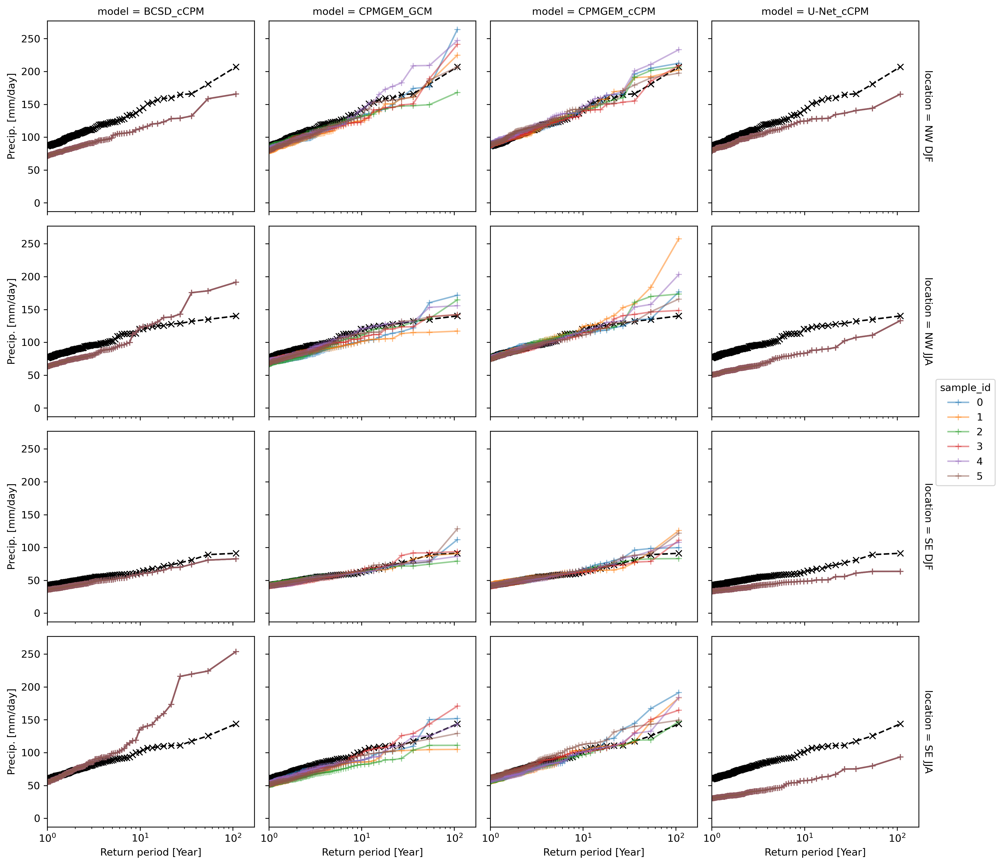

pr Return level errors 
 pr Return level percent errors (%) 
 
 
   
   
 sample_id 
 0 
 1 
 2 
 3 
 4 
 5 
 0 
 1 
 2 
 3 
 4 
 5 
 
 
 location 
 model 
 rp 
   
   
   
   
   
   
   
   
   
   
   
   
 
 
 
 
 NW DJF 
 BCSD_cCPM 
 1.000000 
 -15 
 -15 
 -15 
 -15 
 -15 
 -15 
 -17.3 
 -17.3 
 -17.3 
 -17.3 
 -17.3 
 -17.3 
 
 
 9.818182 
 -28.5 
 -28.5 
 -28.5 
 -28.5 
 -28.5 
 -28.5 
 -20.2 
 -20.2 
 -20.2 
 -20.2 
 -20.2 
 -20.2 
 
 
 108.000000 
 -41.4 
 -41.4 
 -41.4 
 -41.4 
 -41.4 
 -41.4 
 -20 
 -20 
 -20 
 -20 
 -20 
 -20 
 
 
 CPMGEM_GCM 
 1.000000 
 -7.89 
 -6.67 
 -5.93 
 -4.35 
 -3.7 
 -1.21 
 -9.11 
 -7.7 
 -6.85 
 -5.01 
 -4.27 
 -1.4 
 
 
 9.818182 
 -18.5 
 -16.4 
 -10.7 
 -9.52 
 -9.14 
 0.534 
 -13.1 
 -11.6 
 -7.59 
 -6.75 
 -6.48 
 0.379 
 
 
 108.000000 
 -38.9 
 -0.215 
 17.8 
 34.1 
 40.1 
 56.9 
 -18.8 
 -0.104 
 8.6 
 16.5 
 19.4 
 27.5 
 
 
 CPMGEM_cCPM 
 1.000000 
 0.132 
 0.709 
 1.03 
 2.16 
 3.04 
 3.6 
 0.152 
 0.819 
 1.19 
 2.49 
 3.51 
 4.15 
 
 
 9.818182 
 -1.44 
 0.98 
 1.03 
 1.69 
 2.08 
 5.99 
 -1.02 
 0.695 
 0.728 
 1.2 
 1.48 
 4.25 
 
 
 108.000000 
 -9.58 
 -4.72 
 0.0335 
 1.7 
 5.49 
 26.2 
 -4.63 
 -2.28 
 0.0162 
 0.823 
 2.65 
 12.7 
 
 
 U-Net_cCPM 
 1.000000 
 -7.45 
 -7.45 
 -7.45 
 -7.45 
 -7.45 
 -7.45 
 -8.6 
 -8.6 
 -8.6 
 -8.6 
 -8.6 
 -8.6 
 
 
 9.818182 
 -16.6 
 -16.6 
 -16.6 
 -16.6 
 -16.6 
 -16.6 
 -11.8 
 -11.8 
 -11.8 
 -11.8 
 -11.8 
 -11.8 
 
 
 108.000000 
 -41.5 
 -41.5 
 -41.5 
 -41.5 
 -41.5 
 -41.5 
 -20.1 
 -20.1 
 -20.1 
 -20.1 
 -20.1 
 -20.1 
 
 
 NW JJA 
 BCSD_cCPM 
 1.000000 
 -13.1 
 -13.1 
 -13.1 
 -13.1 
 -13.1 
 -13.1 
 -17.2 
 -17.2 
 -17.2 
 -17.2 
 -17.2 
 -17.2 
 
 
 9.818182 
 1.49 
 1.49 
 1.49 
 1.49 
 1.49 
 1.49 
 1.24 
 1.24 
 1.24 
 1.24 
 1.24 
 1.24 
 
 
 108.000000 
 51.3 
 51.3 
 51.3 
 51.3 
 51.3 
 51.3 
 36.6 
 36.6 
 36.6 
 36.6 
 36.6 
 36.6 
 
 
 CPMGEM_GCM 
 1.000000 
 -9.73 
 -8.54 
 -7.83 
 -5.99 
 -5.42 
 -4.41 
 -12.7 
 -11.2 
 -10.2 
 -7.83 
 -7.09 
 -5.76 
 
 
 9.818182 
 -18.9 
 -18.2 
 -14.5 
 -9.63 
 -6.88 
 0.314 
 -15.7 
 -15.1 
 -12.1 
 -8.01 
 -5.72 
 0.261 
 
 
 108.000000 
 -23.1 
 2.09 
 2.09 
 15.6 
 24.6 
 31.5 
 -16.5 
 1.49 
 1.5 
 11.2 
 17.5 
 22.5 
 
 
 CPMGEM_cCPM 
 1.000000 
 -2.53 
 -0.847 
 -0.754 
 -0.297 
 0.083 
 0.957 
 -3.31 
 -1.11 
 -0.986 
 -0.388 
 0.108 
 1.25 
 
 
 9.818182 
 -9.61 
 -6.1 
 -5.08 
 -5.02 
 -3.36 
 3.16 
 -7.99 
 -5.07 
 -4.22 
 -4.17 
 -2.8 
 2.63 
 
 
 108.000000 
 8.39 
 25.8 
 33.4 
 36.6 
 63.1 
 118 
 5.99 
 18.4 
 23.8 
 26.1 
 45 
 83.9 
 
 
 U-Net_cCPM 
 1.000000 
 -25.9 
 -25.9 
 -25.9 
 -25.9 
 -25.9 
 -25.9 
 -33.8 
 -33.8 
 -33.8 
 -33.8 
 -33.8 
 -33.8 
 
 
 9.818182 
 -37.2 
 -37.2 
 -37.2 
 -37.2 
 -37.2 
 -37.2 
 -30.9 
 -30.9 
 -30.9 
 -30.9 
 -30.9 
 -30.9 
 
 
 108.000000 
 -7.1 
 -7.1 
 -7.1 
 -7.1 
 -7.1 
 -7.1 
 -5.07 
 -5.07 
 -5.07 
 -5.07 
 -5.07 
 -5.07 
 
 
 SE DJF 
 BCSD_cCPM 
 1.000000 
 -6.81 
 -6.81 
 -6.81 
 -6.81 
 -6.81 
 -6.81 
 -15.9 
 -15.9 
 -15.9 
 -15.9 
 -15.9 
 -15.9 
 
 
 9.818182 
 -3.04 
 -3.04 
 -3.04 
 -3.04 
 -3.04 
 -3.04 
 -4.88 
 -4.88 
 -4.88 
 -4.88 
 -4.88 
 -4.88 
 
 
 108.000000 
 -8.52 
 -8.52 
 -8.52 
 -8.52 
 -8.52 
 -8.52 
 -9.34 
 -9.34 
 -9.34 
 -9.34 
 -9.34 
 -9.34 
 
 
 CPMGEM_GCM 
 1.000000 
 -1.58 
 -1.15 
 -0.943 
 -0.429 
 -0.415 
 -0.386 
 -3.69 
 -2.68 
 -2.21 
 -1 
 -0.972 
 -0.904 
 
 
 9.818182 
 -0.676 
 0.172 
 0.332 
 0.785 
 1.51 
 1.79 
 -1.09 
 0.276 
 0.533 
 1.26 
 2.42 
 2.87 
 
 
 108.000000 
 -12 
 -4.63 
 -0.395 
 2.57 
 20.7 
 37.3 
 -13.1 
 -5.08 
 -0.433 
 2.82 
 22.8 
 40.9 
 
 
 CPMGEM_cCPM 
 1.000000 
 -1.65 
 -1.36 
 -1 
 -0.346 
 -0.314 
 0.719 
 -3.85 
 -3.19 
 -2.34 
 -0.809 
 -0.733 
 1.68 
 
 
 9.818182 
 -0.275 
 0.932 
 3.37 
 3.63 
 4.28 
 4.38 
 -0.442 
 1.5 
 5.4 
 5.83 
 6.88 
 7.04 
 
 
 108.000000 
 -8.11 
 8.57 
 16.8 
 19.8 
 30.5 
 34.6 
 -8.89 
 9.4 
 18.4 
 21.7 
 33.5 
 38 
 
 
 U-Net_cCPM 
 1.000000 
 -9.5 
 -9.5 
 -9.5 
 -9.5 
 -9.5 
 -9.5 
 -22.2 
 

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)
    rt_ds = xr.concat(
        [
            pred_and_target_return_levels(
                VAR_DAS[var].isel(**SUBREGIONS[srname]).sel(time=(CPM_DAS[var]["time"]["time.season"] == season)).max(dim=["grid_longitude", "grid_latitude"], keep_attrs=True),
                var,
                n_days_per_year=90,
            ).expand_dims(location=[f"{srname} {season}"])
            for (srname, season) in itertools.product(["NW", "SE"], ["DJF", "JJA"])
        ],
        dim="location",
    )
        
    plot_return_levels(rt_ds[f"pred_{var}_return_level"], rt_ds[f"target_{var}_return_level"], row="location")
    plt.show()

    pretty_return_levels_table(rt_ds, var)

## Return time plots (sorting): subregions (domain accumulated seasonal)

### pr

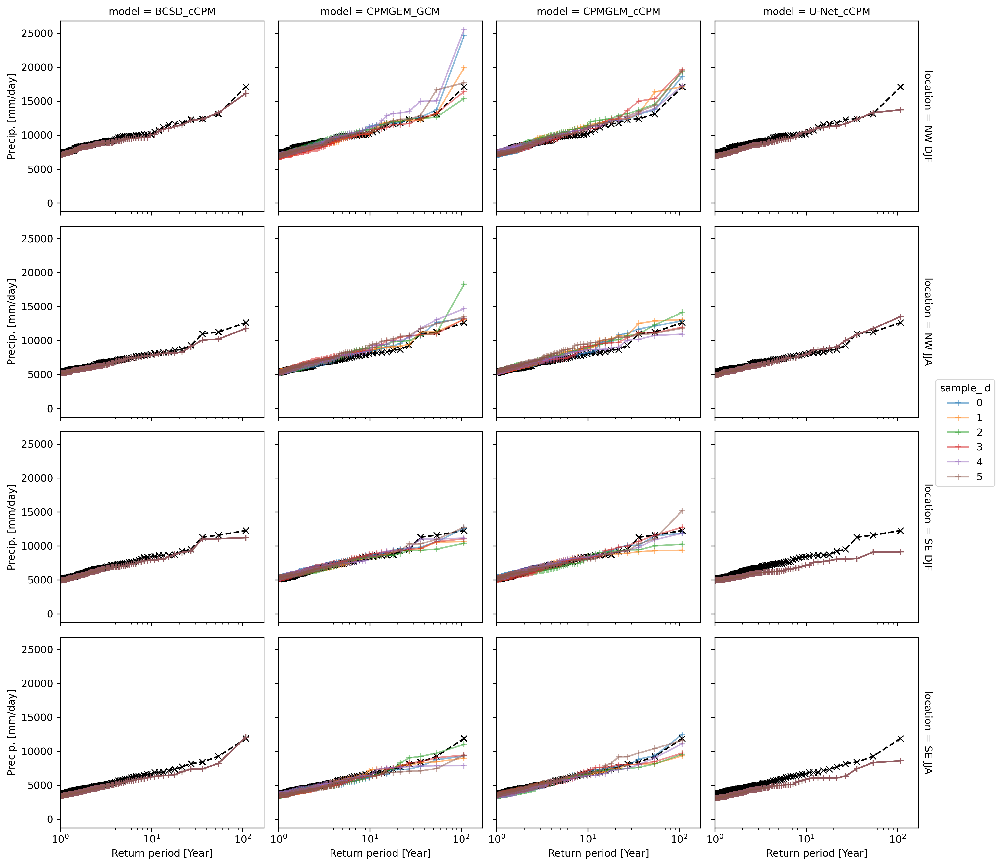

pr Return level errors 
 pr Return level percent errors (%) 
 
 
   
   
 sample_id 
 0 
 1 
 2 
 3 
 4 
 5 
 0 
 1 
 2 
 3 
 4 
 5 
 
 
 location 
 model 
 rp 
   
   
   
   
   
   
   
   
   
   
   
   
 
 
 
 
 NW DJF 
 BCSD_cCPM 
 1.000000 
 -287 
 -287 
 -287 
 -287 
 -287 
 -287 
 -3.9 
 -3.9 
 -3.9 
 -3.9 
 -3.9 
 -3.9 
 
 
 9.818182 
 -89.7 
 -89.7 
 -89.7 
 -89.7 
 -89.7 
 -89.7 
 -0.882 
 -0.882 
 -0.882 
 -0.882 
 -0.882 
 -0.882 
 
 
 108.000000 
 -955 
 -955 
 -955 
 -955 
 -955 
 -955 
 -5.58 
 -5.58 
 -5.58 
 -5.58 
 -5.58 
 -5.58 
 
 
 CPMGEM_GCM 
 1.000000 
 -596 
 -517 
 -433 
 -426 
 -417 
 -319 
 -8.09 
 -7.01 
 -5.87 
 -5.78 
 -5.66 
 -4.32 
 
 
 9.818182 
 52.4 
 88 
 315 
 674 
 986 
 1.05e+03 
 0.515 
 0.865 
 3.1 
 6.63 
 9.7 
 10.3 
 
 
 108.000000 
 -1.71e+03 
 -693 
 594 
 2.8e+03 
 7.53e+03 
 8.44e+03 
 -9.98 
 -4.05 
 3.47 
 16.4 
 44 
 49.3 
 
 
 CPMGEM_cCPM 
 1.000000 
 -355 
 -206 
 -195 
 -46.2 
 17.6 
 35.3 
 -4.82 
 -2.8 
 -2.65 
 -0.626 
 0.238 
 0.478 
 
 
 9.818182 
 762 
 775 
 964 
 994 
 1.27e+03 
 1.3e+03 
 7.49 
 7.61 
 9.48 
 9.78 
 12.4 
 12.8 
 
 
 108.000000 
 40.5 
 180 
 1.55e+03 
 2.27e+03 
 2.35e+03 
 2.53e+03 
 0.237 
 1.05 
 9.07 
 13.2 
 13.7 
 14.8 
 
 
 U-Net_cCPM 
 1.000000 
 -464 
 -464 
 -464 
 -464 
 -464 
 -464 
 -6.29 
 -6.29 
 -6.29 
 -6.29 
 -6.29 
 -6.29 
 
 
 9.818182 
 281 
 281 
 281 
 281 
 281 
 281 
 2.76 
 2.76 
 2.76 
 2.76 
 2.76 
 2.76 
 
 
 108.000000 
 -3.38e+03 
 -3.38e+03 
 -3.38e+03 
 -3.38e+03 
 -3.38e+03 
 -3.38e+03 
 -19.7 
 -19.7 
 -19.7 
 -19.7 
 -19.7 
 -19.7 
 
 
 NW JJA 
 BCSD_cCPM 
 1.000000 
 -165 
 -165 
 -165 
 -165 
 -165 
 -165 
 -3.12 
 -3.12 
 -3.12 
 -3.12 
 -3.12 
 -3.12 
 
 
 9.818182 
 -172 
 -172 
 -172 
 -172 
 -172 
 -172 
 -2.15 
 -2.15 
 -2.15 
 -2.15 
 -2.15 
 -2.15 
 
 
 108.000000 
 -858 
 -858 
 -858 
 -858 
 -858 
 -858 
 -6.79 
 -6.79 
 -6.79 
 -6.79 
 -6.79 
 -6.79 
 
 
 CPMGEM_GCM 
 1.000000 
 -129 
 -127 
 -90.7 
 -72.6 
 18.9 
 125 
 -2.44 
 -2.41 
 -1.71 
 -1.37 
 0.357 
 2.36 
 
 
 9.818182 
 411 
 510 
 622 
 638 
 883 
 1.2e+03 
 5.13 
 6.36 
 7.76 
 7.96 
 11 
 15 
 
 
 108.000000 
 480 
 543 
 616 
 843 
 2.03e+03 
 5.65e+03 
 3.8 
 4.3 
 4.87 
 6.67 
 16.1 
 44.7 
 
 
 CPMGEM_cCPM 
 1.000000 
 51.9 
 55.9 
 74 
 87.1 
 93.8 
 111 
 0.98 
 1.06 
 1.4 
 1.65 
 1.77 
 2.09 
 
 
 9.818182 
 246 
 667 
 739 
 1.01e+03 
 1.09e+03 
 1.46e+03 
 3.07 
 8.32 
 9.21 
 12.5 
 13.6 
 18.3 
 
 
 108.000000 
 -1.7e+03 
 -830 
 -677 
 279 
 454 
 1.5e+03 
 -13.4 
 -6.56 
 -5.35 
 2.21 
 3.59 
 11.9 
 
 
 U-Net_cCPM 
 1.000000 
 -354 
 -354 
 -354 
 -354 
 -354 
 -354 
 -6.7 
 -6.7 
 -6.7 
 -6.7 
 -6.7 
 -6.7 
 
 
 9.818182 
 -3.96 
 -3.96 
 -3.96 
 -3.96 
 -3.96 
 -3.96 
 -0.0494 
 -0.0494 
 -0.0494 
 -0.0494 
 -0.0494 
 -0.0494 
 
 
 108.000000 
 892 
 892 
 892 
 892 
 892 
 892 
 7.06 
 7.06 
 7.06 
 7.06 
 7.06 
 7.06 
 
 
 SE DJF 
 BCSD_cCPM 
 1.000000 
 -256 
 -256 
 -256 
 -256 
 -256 
 -256 
 -4.98 
 -4.98 
 -4.98 
 -4.98 
 -4.98 
 -4.98 
 
 
 9.818182 
 -507 
 -507 
 -507 
 -507 
 -507 
 -507 
 -6.04 
 -6.04 
 -6.04 
 -6.04 
 -6.04 
 -6.04 
 
 
 108.000000 
 -1.03e+03 
 -1.03e+03 
 -1.03e+03 
 -1.03e+03 
 -1.03e+03 
 -1.03e+03 
 -8.42 
 -8.42 
 -8.42 
 -8.42 
 -8.42 
 -8.42 
 
 
 CPMGEM_GCM 
 1.000000 
 -7.12 
 94.2 
 158 
 166 
 188 
 253 
 -0.138 
 1.83 
 3.07 
 3.23 
 3.65 
 4.91 
 
 
 9.818182 
 -62.3 
 -49.6 
 40.6 
 101 
 291 
 389 
 -0.743 
 -0.592 
 0.484 
 1.2 
 3.47 
 4.64 
 
 
 108.000000 
 -1.87e+03 
 -1.63e+03 
 -1.2e+03 
 -1.11e+03 
 344 
 484 
 -15.2 
 -13.3 
 -9.79 
 -9.04 
 2.81 
 3.94 
 
 
 CPMGEM_cCPM 
 1.000000 
 -141 
 -78.5 
 38.4 
 88.3 
 157 
 233 
 -2.74 
 -1.53 
 0.746 
 1.72 
 3.06 
 4.52 
 
 
 9.818182 
 -337 
 -178 
 -143 
 -18.5 
 86.7 
 118 
 -4.02 
 -2.12 
 -1.7 
 -0.221 
 1.03 
 1.4 
 
 
 108.000000 
 -2.88e+03 
 -2.01e+03 
 -385 
 -369 
 485 
 2.93e+03 
 -23.5 
 -16.4 
 -3.14 
 -3.01 
 3.95 
 23.9 
 
 
 U-Net_cCPM 
 1.000000 
 -239 
 -239 
 -239 
 -239 
 -239 
 -239 
 -4.64 


In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)
    rt_ds = xr.concat(
        [
            pred_and_target_return_levels(
                VAR_DAS[var].isel(**SUBREGIONS[srname]).sel(time=(CPM_DAS[var]["time"]["time.season"] == season)).sum(dim=["grid_longitude", "grid_latitude"], keep_attrs=True),
                var,
                n_days_per_year=90,
            ).expand_dims(location=[f"{srname} {season}"])
            for (srname, season) in itertools.product(["NW", "SE"], ["DJF", "JJA"])
        ],
        dim="location",
    )
        
    plot_return_levels(rt_ds[f"pred_{var}_return_level"], rt_ds[f"target_{var}_return_level"], row="location")
    plt.show()

    pretty_return_levels_table(rt_ds, var)